### common part

In [1]:
import sys
sys.path.insert(0, "/home/natnael/old_files/ViT-Prisma/src")

import os
from pathlib import Path

import numpy as np
import torch
from torch.utils.data import DataLoader, Subset

from vit_prisma.utils.constants import BASE_DIR, DATA_DIR, MODEL_DIR, DEVICE, MODEL_CHECKPOINTS_DIR
from vit_prisma.utils.tutorial_utils import calculate_clean_accuracy, load_clip_models, plot_image, get_feature_activations
from vit_prisma.utils.data_utils.loader import load_dataset
from vit_prisma.utils.tutorial_utils import plot_act_distribution
from vit_prisma.utils.tutorial_utils import plot_top_imgs_for_features

/home/natnael/prisma/lib/python3.14/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/home/natnael/prisma/lib/python3.14/site-packages/kaleido/_sync_server.py:11: UserWarning:




This means that static image generation (e.g. `fig.write_image()`) will not work.

Please upgrade Plotly to version 6.1.1 or greater, or downgrade Kaleido to version 0.2.1.

You can however, use the Kaleido API directly which will work with your plotly version. `kaleido.write_fig(...)`, for example. Please see the kaleido documentation.




In [3]:
DEVICE = 'cuda:0' # change to cpu if cpu only paradigm
BATCH_SIZE = 16

In [8]:
# Load an SAE
from huggingface_hub import hf_hub_download, list_repo_files
from vit_prisma.sae import SparseAutoencoder
import glob

def load_sae(repo_id, file_name, config_name):
    # Step 1: Download SAE from Hugginface
    sae_path = hf_hub_download(repo_id, file_name) # Download weights
    hf_hub_download(repo_id, config_name) # Download config

    # sae_path = repo_id
    # Step 2: Load the pretrained SAE weights from the downloaded path
    print(f"Loading SAE from {sae_path}...")
    sae = SparseAutoencoder.load_from_pretrained(sae_path) # This now automatically gets config.json and converts into the VisionSAERunnerConfig object
    return sae

def my_load_sae(pth):
    config_path = os.path.join(pth, "config.json")
    # weights_path = os.path.join(pth, "n_images_13000704.pt")
    weights = glob.glob(os.path.join(pth, "*.pt"))
    # remove files if "log" in the name
    weights = [w for w in weights if "log" not in w]
    weights.sort(key=lambda x: int(''.join(filter(str.isdigit, os.path.basename(x)))))
    weights_path = weights[-1]

    print(f"----------------Loading SAE from {weights_path} ----------------")

    sae = SparseAutoencoder.load_from_pretrained(weights_path=weights_path, config_path=config_path) # This now automatically gets config.json and converts into the VisionSAERunnerConfig object
    sae.eval()
    sae.to(DEVICE)
    
    return sae

repo_id = "Prisma-Multimodal/sparse-autoencoder-clip-b-32-sae-vanilla-x64-layer-10-hook_mlp_out-l1-1e-05" # Change this to your chosen SAE. See /docs for a list of SAEs.
repo_id2 = "/home/nfm/ViT-Prisma/demos/sae_ckpts/ee158df6-tinyclip_sae_16_hyperparam_sweep_lr"
repo_id3 = "/home/nfm/ViT-Prisma/demos/sae_ckpts/892ec2b9-tinyclip_sae_16_hyperparam_sweep_lr"
repo_id4 = "/home/nfm/ViT-Prisma/demos/sae_ckpts/f103614d-tinyclip_sae_16_hyperparam_sweep_lr"
repo_id5 = "/home/nfm/ViT-Prisma/demos/sae_ckpts/59fcae83-sae_training_clip_b16"
repo_id6 = "/home/nfm/ViT-Prisma/demos/sae_ckpts/82d22c1d-sae_training_clip_b16_cls_only"
repo_id7 = "/home/nfm/ViT-Prisma/demos/sae_ckpts/dfd0c79c-sae_training_clip_b16_cls_only2"
repo_id8 = "/home/natnael/old_files/ViT-Prisma/demos/sae_ckpts/29e0111c-claude_topk_all"
file_name = "weights.pt"
config_name = "config.json"
sae = my_load_sae(repo_id8)
# sae = load_sae(repo_id, file_name, config_name)

2026-08-06 16:47:30 WARNING:root: Warning: We are initializing b_dec to zeros. This is probably not what you want.
2026-08-06 16:47:30 INFO:root: n_tokens_per_buffer (millions): 1.613824
2026-08-06 16:47:30 INFO:root: Lower bound: n_contexts_per_buffer (millions): 0.008192
2026-08-06 16:47:30 INFO:root: Total training steps: 625244
2026-08-06 16:47:30 INFO:root: Total training images: 6500000
2026-08-06 16:47:30 INFO:root: Total wandb updates: 62524
2026-08-06 16:47:30 INFO:root: Expansion factor: 16
2026-08-06 16:47:30 INFO:root: n_tokens_per_feature_sampling_window (millions): 201.728
2026-08-06 16:47:30 INFO:root: n_tokens_per_dead_feature_window (millions): 2017.28
2026-08-06 16:47:30 INFO:root: We will reset the sparsity calculation 1250 times.
2026-08-06 16:47:30 INFO:root: Number tokens in sparsity calculation window: 1.02e+06
2026-08-06 16:47:30 INFO:root: Gradient clipping with max_norm=1.0
2026-08-06 16:47:30 INFO:root: Using SAE initialization method: independent
2026-08-06 

----------------Loading SAE from /home/natnael/old_files/ViT-Prisma/demos/sae_ckpts/29e0111c-claude_topk_all/n_images_6500008.pt ----------------


In [9]:
from pprint import pprint
sae.cfg
pprint(sae.cfg)

VisionModelSAERunnerConfig(model_class_name='HookedViT',
                           model_name='open-clip:laion/CLIP-ViT-B-16-laion2B-s34B-b88K',
                           vit_model_cfg=None,
                           model_path=None,
                           hook_point_layer=11,
                           layer_subtype='hook_resid_post',
                           hook_point_head_index=None,
                           context_size=197,
                           use_cached_activations=True,
                           use_patches_only=False,
                           cached_activations_path='/home/nfm/Desktop/rhome/nfm/ViT-Prisma/demos/activation_cache/blocks11_resid_post_all',
                           image_size=224,
                           architecture='standard',
                           b_dec_init_method='zeros',
                           expansion_factor=16,
                           from_pretrained_path=None,
                           is_transcoder=False,
         

In [10]:
# Load model
from vit_prisma.models.model_loader import load_hooked_model

model_name = sae.cfg.model_name
model = load_hooked_model(model_name)
model.to(DEVICE); # Move to device

2026-08-06 16:55:28 INFO:root: Model 'open-clip:laion/CLIP-ViT-B-16-laion2B-s34B-b88K' is supported and passes tests.
2026-08-06 16:55:28 INFO:root: model_id download_pretrained_from_hf: laion/CLIP-ViT-B-16-laion2B-s34B-b88K
2026-08-06 16:55:28 DEBUG:httpcore.connection: connect_tcp.started host='huggingface.co' port=443 local_address=None timeout=3 socket_options=None
2026-08-06 16:55:28 DEBUG:httpcore.connection: connect_tcp.complete return_value=<httpcore._backends.sync.SyncStream object at 0x78dae7361400>
2026-08-06 16:55:28 DEBUG:httpcore.connection: start_tls.started ssl_context=<ssl.SSLContext object at 0x78dae75ad640> server_hostname='huggingface.co' timeout=3
2026-08-06 16:55:28 DEBUG:httpcore.connection: start_tls.complete return_value=<httpcore._backends.sync.SyncStream object at 0x78dae7364050>
2026-08-06 16:55:28 DEBUG:httpcore.http11: send_request_headers.started request=<Request [b'GET']>
2026-08-06 16:55:28 DEBUG:httpcore.http11: send_request_headers.complete
2026-08-06

*****Loading model 'open-clip:laion/CLIP-ViT-B-16-laion2B-s34B-b88K' of type 'VISION'


2026-08-06 16:55:28 DEBUG:httpcore.http11: receive_response_body.started request=<Request [b'GET']>
2026-08-06 16:55:28 DEBUG:httpcore.http11: receive_response_body.complete
2026-08-06 16:55:28 DEBUG:httpcore.http11: response_closed.started
2026-08-06 16:55:28 DEBUG:httpcore.http11: response_closed.complete
2026-08-06 16:55:28 DEBUG:httpcore.http11: send_request_headers.started request=<Request [b'HEAD']>
2026-08-06 16:55:28 DEBUG:httpcore.http11: send_request_headers.complete
2026-08-06 16:55:28 DEBUG:httpcore.http11: send_request_body.started request=<Request [b'HEAD']>
2026-08-06 16:55:28 DEBUG:httpcore.http11: send_request_body.complete
2026-08-06 16:55:28 DEBUG:httpcore.http11: receive_response_headers.started request=<Request [b'HEAD']>
2026-08-06 16:55:29 DEBUG:httpcore.http11: receive_response_headers.complete return_value=(b'HTTP/1.1', 307, b'Temporary Redirect', [(b'Content-Type', b'text/plain; charset=utf-8'), (b'Content-Length', b'298'), (b'Connection', b'keep-alive'), (b'D

In [6]:
# Put paths here
from vit_prisma.transforms import get_clip_val_transforms
from torchvision import datasets, transforms
import torchvision

def load_imagenet(imagenet_validation_path, model_type="clip"):
    torch.set_grad_enabled(False)


    # Load dataset with CLIP transform
    if model_type == "clip":
        data_transforms = get_clip_val_transforms()
    else:
        data_transforms = transforms.Compose([
        transforms.Resize(256, interpolation=transforms.InterpolationMode.BICUBIC),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ])
    val_data = torchvision.datasets.ImageFolder(imagenet_validation_path, transform=data_transforms)

    # We'll also load a version of the dataset without the CLIP transform so that we can visualize it beautifully
    viz_transforms = torchvision.transforms.Compose(
                    [
                        torchvision.transforms.Resize((224, 224)),
                        torchvision.transforms.ToTensor(),
                    ]
                )
    viz_data = torchvision.datasets.ImageFolder(imagenet_validation_path, transform=viz_transforms)

    # We only want a subset of validation
            
    subset_dataloader = DataLoader(val_data, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)

    # We only want a subset 
    
    return subset_dataloader, val_data, viz_data

# Put your imagenet path here. You can download ImageNet from kaggle.
imagenet_validation_path = '/home/nfm/data_prisma/imagenet_val/kaggle/input/imagenet-object-localization-challenge/ILSVRC/Data/CLS-LOC/val'
full_dataloader, full_dataset, full_viz_data = load_imagenet(imagenet_validation_path)

print(f"Number of samples in the subset: {len(full_dataloader.dataset)}")
print(f"Number of samples in the full dataset: {len(full_dataset)}")

Number of samples in the subset: 50000
Number of samples in the full dataset: 50000


In [7]:
import torch
from torch.utils.data import DataLoader, Subset
from torchvision import datasets, transforms
from vit_prisma.transforms import get_clip_val_transforms
import numpy as np

def load_imagenet(imagenet_validation_path, images_per_class=5, model_type="clip"):
    torch.set_grad_enabled(False)
    
    # 1. Load the full dataset first (this just indexes the files, doesn't load images into RAM)
    if model_type == "clip":
        data_transforms = get_clip_val_transforms()
    else:
        data_transforms = transforms.Compose([
        transforms.Resize(256, interpolation=transforms.InterpolationMode.BICUBIC),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ])
    full_val_data = datasets.ImageFolder(imagenet_validation_path, transform=data_transforms)
    
    viz_transforms = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
    ])
    full_viz_data = datasets.ImageFolder(imagenet_validation_path, transform=viz_transforms)

    # 2. Logic to pick 5 indices per class
    targets = np.array(full_val_data.targets)
    subset_indices = []
    
    for class_idx in range(len(full_val_data.classes)):
        # Find all indices belonging to this class
        class_indices = np.where(targets == class_idx)[0]
        # Take the first 'n' images
        subset_indices.extend(class_indices[:images_per_class])

    # 3. Create the Subsets
    val_subset = Subset(full_val_data, subset_indices)
    viz_subset = Subset(full_viz_data, subset_indices)

    # 4. Create Dataloader from the subset
    subset_dataloader = DataLoader(
        val_subset, 
        batch_size=BATCH_SIZE, 
        shuffle=False, 
        num_workers=4
    )

    return subset_dataloader, val_subset, viz_subset

# Usage
imagenet_validation_path = '/home/nfm/data_prisma/imagenet_val/kaggle/input/imagenet-object-localization-challenge/ILSVRC/Data/CLS-LOC/val'
subset_dataloader, subset_dataset, viz_data = load_imagenet(imagenet_validation_path, images_per_class=5, model_type="clip")

In [8]:
import matplotlib.pyplot as plt
from torchvision import transforms

def plot_image(image, unstandardise=True):
    plt.figure()
    plt.axis("off")

    if unstandardise:
        print("Unstandardizing image")
        get_inverse = transforms.Normalize(
            mean=[-0.485 / 0.229, -0.456 / 0.224, -0.406 / 0.225],
            std=[1 / 0.229, 1 / 0.224, 1 / 0.225],
        )
        image = get_inverse(image)

    image = image.permute(1, 2, 0)
    plt.imshow(image, vmin=-2.5, vmax=2.0)


2026-06-10 23:55:39 DEBUG:matplotlib.pyplot: Loaded backend module://matplotlib_inline.backend_inline version unknown.
2026-06-10 23:55:39 DEBUG:matplotlib.pyplot: Loaded backend module://matplotlib_inline.backend_inline version unknown.
2026-06-10 23:55:39 DEBUG:matplotlib.font_manager: findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=10.0.
2026-06-10 23:55:39 DEBUG:matplotlib.font_manager: findfont: score(FontEntry(fname='/home/nfm/prisma/lib/python3.12/site-packages/matplotlib/mpl-data/fonts/ttf/STIXGeneral.ttf', name='STIXGeneral', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
2026-06-10 23:55:39 DEBUG:matplotlib.font_manager: findfont: score(FontEntry(fname='/home/nfm/prisma/lib/python3.12/site-packages/matplotlib/mpl-data/fonts/ttf/STIXGeneralBolIta.ttf', name='STIXGeneral', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
2026-06-10 23:55:39 DEBUG:mat

Unstandardizing image


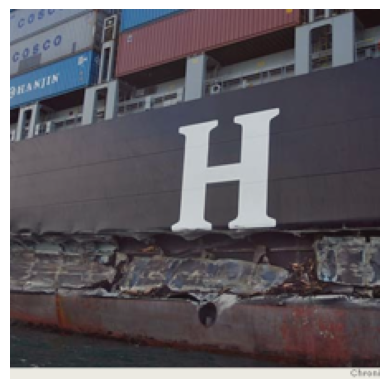

In [9]:
from PIL import Image
from vit_prisma.transforms import get_clip_val_transforms
import glob
import random

# pths = glob.glob("/home/nfm/rand_imgs/*.jpg")

indices_dict = torch.load("/home/nfm/ViT-Prisma/demos/indices_forclip_dict.pt", weights_only=False)
txt_pth = "/home/nfm/clip_text_span/text_descriptions/image_descriptions_general.txt"
with open(txt_pth, "r") as f:
    texts = [line.strip() for line in f.readlines()]


# img = Image.open(pths[1]).convert()  # Ensure it's 3 channels

# mytransform = get_clip_val_transforms()
# # mytransform = transforms.Compose([
# #         transforms.Resize(256, interpolation=transforms.InterpolationMode.BICUBIC),
# #         transforms.CenterCrop(224),
# #         transforms.ToTensor(),
# #         transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
# #         ])
# img_tensor = mytransform(img)
# plot_image(img_tensor.detach().cpu(), unstandardise=True)


txt = "A photo with the letter H"
txt_ind = texts.index(txt)

# txt_ind = random.randint(0, len(texts)-1)

class_inds = indices_dict[txt_ind]


img_tensor = full_dataset[class_inds[0]][0]  # Get the first image of the class
# select random image from the whole dataset, ignore class_inds for now
# random_idx = random.randint(0, len(full_dataset)-1)
# img_tensor = full_dataset[random_idx][0]

plot_image(img_tensor.detach().cpu(), unstandardise=True)


In [10]:
import json
LOCAL_JSON_PATH = "/home/nfm/ViT-Prisma/demos/imagenet_class_index.json"
with open(LOCAL_JSON_PATH, 'r') as f:
    imagenet_class_index = json.load(f)

wnid_to_name = {}
for idx, (wnid, class_name) in imagenet_class_index.items():
    safe_class_name = class_name.replace(" ", "_").replace("/", "_").replace(",", "")
    wnid_to_name[wnid] = safe_class_name

wnid_to_idx = {wnid: int(idx) for idx, (wnid, name) in imagenet_class_index.items()}
idx_to_name = {int(idx): name for idx, (wnid, name) in imagenet_class_index.items()}

idx_to_wnid = {int(idx): wnid for idx, (wnid, name) in imagenet_class_index.items()}
name_to_idx = {name: int(idx) for idx, (wnid, name) in imagenet_class_index.items()}

indices_dict = torch.load("/home/nfm/ViT-Prisma/demos/indices_forclip_dict.pt", weights_only=False)

### old parts

In [94]:
def get_feature_activations(model_input, model, sae):
    # Run the batch through the model to get activations
    _, cache = model.run_with_cache(model_input, names_filter=sae.cfg.hook_point)
    hook_point_activation = cache[sae.cfg.hook_point].to(DEVICE)

    # Calculate the SAE features and stats for the batch
    _, feature_acts, *_ = sae(hook_point_activation)

    return feature_acts

In [95]:
_, cache = model.run_with_cache(img_tensor.to(DEVICE).unsqueeze(0), names_filter=sae.cfg.hook_point)
hook_point_activation = cache[sae.cfg.hook_point].to(DEVICE)

# 2. Extract ONLY the CLS token first!
# Shape goes from [Batch, 50, d_in] -> [Batch, d_in]
cls_activation = hook_point_activation[:, 0, :] 

# 3. Calculate the SAE features for JUST the CLS token
_, feature_acts, *_ = sae(cls_activation)
feature_acts.shape

torch.Size([1, 12288])

In [96]:
feature_activations = get_feature_activations(img_tensor.to(DEVICE).unsqueeze(0), model, sae)
print(feature_activations.shape)
feature_activations = feature_activations[0,0,:]
print(feature_activations.shape)

torch.Size([1, 197, 12288])
torch.Size([12288])


In [97]:
def get_feature_activations(model_input, model, sae, cls_only=True):
    # 1. Run the batch through the ViT to get activations
    _, cache = model.run_with_cache(model_input, names_filter=sae.cfg.hook_point)
    hook_point_activation = cache[sae.cfg.hook_point].to(DEVICE)

    # 2. Extract ONLY the CLS token first!
    # Shape goes from [Batch, 50, d_in] -> [Batch, d_in]
    if cls_only:
        cls_activation = hook_point_activation[:, 0, :]
        print(f"CLS Activation Shape: {cls_activation.shape}")
        # 3. Calculate the SAE features for JUST the CLS token
        _, feature_acts, *_ = sae(cls_activation)
    else:
        # If not CLS only, calculate SAE features for all tokens
        batch_size, num_tokens, _ = hook_point_activation.shape
        feature_acts = []
        for i in range(num_tokens):
            token_activation = hook_point_activation[:, i, :]
            _, token_feature_acts, *_ = sae(token_activation)
            feature_acts.append(token_feature_acts.unsqueeze(1))  # Shape: [Batch, 1, d_sae]
        feature_acts = torch.cat(feature_acts, dim=1)  # Shape: [Batch, num_tokens, d_sae]
        # average across tokens to get a single feature vector per batch item
        feature_acts = feature_acts.mean(dim=1)  # Shape: [Batch, d_sae]

    return feature_acts

# Now the output is already just the CLS features!
mybool = True
feature_activations = get_feature_activations(img_tensor.to(DEVICE).unsqueeze(0), model, sae, cls_only=mybool)
print(feature_activations.shape) # Will be [1, d_sae]

# Just grab the first batch item
feature_activations = feature_activations[0] 
print(feature_activations.shape) # Will be [d_sae]

CLS Activation Shape: torch.Size([1, 768])
torch.Size([1, 12288])
torch.Size([12288])


In [98]:
top_indices, ggg = plot_act_distribution(
    feature_activations,
    n_top=10
)

# sort the top indices by their ggg values
top_indices = [x for _, x in sorted(zip(ggg, top_indices), reverse=True)]
top_indices = [x.item() for x in top_indices]
print("Top indices sorted by activation value:")
print(top_indices)
# print(sorted_top_indices)

Top 10 feature indices: [5810, 12189, 641, 2289, 2984, 4581, 6602, 4159, 8970, 9002]
Top 10 feature values: [2.3489072 2.3832054 2.4512432 2.47398   2.6792018 2.692339  2.7680945
 2.9231942 3.4174738 5.552508 ]


Top indices sorted by activation value:
[9002, 8970, 4159, 6602, 4581, 2984, 2289, 641, 12189, 5810]


In [99]:
from typing import List, Dict, Tuple, Set, Optional, Union
import einops
import torch
from tqdm import tqdm

@torch.no_grad()
def compute_feature_activations(
    images: torch.Tensor,
    model: torch.nn.Module,
    sparse_autoencoder: torch.nn.Module,
    encoder_weights: torch.Tensor,
    encoder_biases: torch.Tensor,
    feature_ids: List[int],
    is_cls_list: List[bool],
    top_k: int = 10,
    sampling_type: str = 'max'
) -> Dict[int, Tuple[torch.Tensor, torch.Tensor]]:
    """
    Compute the highest activating tokens for given features in a batch of images.
    
    Args:
        images: Input images
        model: The main model
        sparse_autoencoder: The sparse autoencoder
        encoder_weights: Encoder weights for selected features
        encoder_biases: Encoder biases for selected features
        feature_ids: List of feature IDs to analyze
        is_cls_list: Whether to use CLS token activations for each feature
        top_k: Number of top activations to return per feature
        sampling_type: How to sample activations across tokens ('avg' for average)

    Returns:
        Dictionary mapping feature IDs to tuples of (top_indices, top_values)
    """
    # Run model and get activations
    _, cache = model.run_with_cache(images, names_filter=[sparse_autoencoder.cfg.hook_point])
    
    layer_activations = cache[sparse_autoencoder.cfg.hook_point]
    batch_size, seq_len, _ = layer_activations.shape

    # Ensure top_k is not greater than batch size
    actual_top_k = min(top_k, batch_size)
    
    # Flatten activations for efficient computation
    flattened_activations = einops.rearrange(layer_activations, "batch seq d_mlp -> (batch seq) d_mlp")
    
    # Compute feature activations using the SAE
    sae_input = flattened_activations - sparse_autoencoder.b_dec
    feature_activations = einops.einsum(sae_input, encoder_weights, "... d_in, d_in n -> ... n") + encoder_biases
    feature_activations = torch.nn.functional.relu(feature_activations)
    
    # Reshape back to batch × seq × features
    reshaped_activations = einops.rearrange(
        feature_activations, 
        "(batch seq) features -> batch seq features", 
        batch=batch_size, 
        seq=seq_len
    )
    
    # Get CLS token activations (first token)
    cls_token_activations = reshaped_activations[:, 0, :]
    
    # Get average activations across tokens if requested
    if sampling_type == 'avg':
        mean_image_activations = reshaped_activations.mean(dim=1)
    elif sampling_type == 'max':
        # Get maximum activation across all tokens for each feature
        mean_image_activations, _ = reshaped_activations.max(dim=1)
    else:
        raise ValueError(f"Invalid sampling type: {sampling_type}, or not implemented yet")

    # Create result dictionary
    top_activations = {}
    
    # For each feature, get top-k activating images
    for feature_idx, (feature_id, is_cls) in enumerate(zip(feature_ids, is_cls_list)):
        if is_cls:
            # Use CLS token activations
            feature_values = cls_token_activations[:, feature_idx]
        else:
            # Use mean activations across tokens
            feature_values = mean_image_activations[:, feature_idx]
        
        # Get top-k values and indices
        top_values, top_indices = feature_values.topk(actual_top_k)
        top_activations[feature_id] = (top_indices, top_values)
    
    return top_activations

def find_top_activations(
    val_dataloader: torch.utils.data.DataLoader,
    model: torch.nn.Module,
    sparse_autoencoder: torch.nn.Module,
    interesting_features_indices: List[int],
    is_cls_list: List[bool],
    top_k: int = 16,
    max_samples: int = 50_000,
    batch_size: int = 64, 
    sampling_type: str = 'avg'
) -> Dict[int, Tuple[torch.Tensor, torch.Tensor]]:
    """
    Find the top activations for interesting features across the validation dataset.
    
    Args:
        val_dataloader: DataLoader for validation dataset
        model: Model to analyze
        sparse_autoencoder: Sparse autoencoder
        interesting_features_indices: List of feature indices to analyze
        is_cls_list: Whether to use CLS token for each feature
        top_k: Number of top images to return per feature
        max_samples: Maximum number of samples to process
        batch_size: Batch size for processing
        sampling_type: How to sample activations across tokens
        
    Returns:
        Dictionary mapping feature IDs to tuples of (top_values, top_dataset_indices)
    """
    device = next(model.parameters()).device
    
    # Dictionary to store values and indices for all features
    all_feature_activations = {}
    for feature_id in interesting_features_indices:
        all_feature_activations[feature_id] = {
            'values': [],
            'dataset_indices': []
        }
    
    # Extract weights and biases for relevant features
    encoder_biases = sparse_autoencoder.b_enc[interesting_features_indices]
    encoder_weights = sparse_autoencoder.W_enc[:, interesting_features_indices]

    # Track global dataset indices
    global_idx = 0
    processed_samples = 0
    
    # Process batches
    for batch_idx, (batch_images, batch_labels) in enumerate(tqdm(val_dataloader, total=min(len(val_dataloader), max_samples // batch_size))):
        # Move batch to device
        batch_images = batch_images.to(device)
        current_batch_size = batch_images.shape[0]
        
        # Generate dataset indices for this batch
        batch_dataset_indices = torch.arange(
            global_idx, 
            global_idx + current_batch_size, 
            dtype=torch.long, 
            device=device
        )
        global_idx += current_batch_size
        
        # Get activations for this batch
        batch_activations = compute_feature_activations(
            batch_images, 
            model, 
            sparse_autoencoder, 
            encoder_weights, 
            encoder_biases,
            interesting_features_indices, 
            is_cls_list, 
            top_k=top_k,
            sampling_type=sampling_type
        )

        # For each feature, store values and corresponding dataset indices
        for feature_id in interesting_features_indices:
            # Get top indices and values for this feature in this batch
            batch_top_indices, batch_top_values = batch_activations[feature_id]
            
            # Map batch indices to dataset indices
            dataset_indices = batch_dataset_indices[batch_top_indices]
            
            # Store values and indices
            all_feature_activations[feature_id]['values'].append(batch_top_values)
            all_feature_activations[feature_id]['dataset_indices'].append(dataset_indices)

        # Update processed samples count
        processed_samples += current_batch_size
        if processed_samples >= max_samples:
            break

    # Process all activations to get overall top-k
    final_results = {}
    
    for feature_id in interesting_features_indices:
        # Concatenate all values and indices for this feature
        all_values = torch.cat(all_feature_activations[feature_id]['values']) if all_feature_activations[feature_id]['values'] else torch.tensor([], device=device)
        all_indices = torch.cat(all_feature_activations[feature_id]['dataset_indices']) if all_feature_activations[feature_id]['dataset_indices'] else torch.tensor([], device=device, dtype=torch.long)
        
        # Handle empty case
        if len(all_indices) == 0:
            final_results[feature_id] = (torch.tensor([]), torch.tensor([]))
            continue
        
        # Find unique dataset indices and keep the highest activation per index
        unique_dict = {}
        for i, (val, idx) in enumerate(zip(all_values, all_indices)):
            idx_item = idx.item()
            if idx_item not in unique_dict or val > all_values[unique_dict[idx_item]]:
                unique_dict[idx_item] = i
        
        # Extract unique values and indices
        unique_values = torch.tensor([all_values[i].item() for i in unique_dict.values()], device=device)
        unique_dataset_indices = torch.tensor(list(unique_dict.keys()), device=device, dtype=torch.long)
        
        # Get top-k
        if len(unique_values) > 0:
            k = min(top_k, len(unique_values))
            top_k_values, top_k_idxs = torch.topk(unique_values, k)
            top_dataset_indices = unique_dataset_indices[top_k_idxs]
            
            final_results[feature_id] = (top_k_values.detach().cpu(), top_dataset_indices.detach().cpu())
        else:
            final_results[feature_id] = (torch.tensor([]), torch.tensor([]))

    return final_results

In [100]:
top_activations_dictionary = find_top_activations(subset_dataloader, model, sae, top_indices, [mybool]*len(top_indices), batch_size=16)

  0%|          | 0/313 [00:00<?, ?it/s]

100%|██████████| 313/313 [00:32<00:00,  9.74it/s]


In [101]:
sorted_features = sorted(top_activations_dictionary.items(), key=lambda x: x[1][0].mean() if len(x[1][0]) > 0 else float('-inf'), reverse=True)
# change it back to dictionary
sorted_top_activations_dictionary = {k: v for k, v in sorted_features}

In [102]:
def plot_all_features(top_activations_dict, viz_data, cfg, num_features=None):
    """
    Plot top activating images for all features in the dictionary.
    
    Args:
        top_activations_dict: Dictionary mapping feature_idx to (activation_values, image_indices)
        viz_data: Dataset containing images
        cfg: Configuration object with hook_point
        num_features: Optional limit on number of features to plot (None = all)
    """
    # Sort features by their keys to ensure consistent order
    # feature_indices = sorted(top_activations_dict.keys())
    feature_indices = list(top_activations_dict.keys())
    
    # Limit number of features if specified
    if num_features is not None:
        feature_indices = feature_indices[:num_features]
    
    print(f"Plotting {len(feature_indices)} features")
    
    # Plot each feature
    for feature_idx in feature_indices:
        activation_values, imagenet_indices = top_activations_dict[feature_idx]
        
        # Create plot grid
        grid_size = int(np.ceil(np.sqrt(len(imagenet_indices))))
        fig, axs = plt.subplots(int(np.ceil(len(imagenet_indices) / grid_size)), grid_size, figsize=(8, 8))
        fig.suptitle(f"Layer: {cfg.hook_point}, Feature: {feature_idx}")
        
        axs = axs.flatten()
        for i, (image_idx, act_value) in enumerate(zip(imagenet_indices, activation_values)):
            # Get and display image
            image_idx_int = image_idx.item()
            image_tensor = viz_data[image_idx_int][0]  # Assuming viz_data returns (image, _, _)

            
            # Convert to numpy for display
            display = image_tensor.detach().cpu().numpy().transpose(1, 2, 0)

            mean = np.array([0.485, 0.456, 0.406]).reshape((1, 1, 3))
            std = np.array([0.229, 0.224, 0.225]).reshape((1, 1, 3))
            display = display * std + mean
            
            # Clip values to valid image range [0, 1]
            display = np.clip(display, 0, 1)
            
            axs[i].imshow(display)
            axs[i].set_title(f"Img idx: {image_idx_int} Act: {act_value.item():.3f}")
            axs[i].axis("off")
        
        # Turn off unused subplots
        for j in range(i + 1, len(axs)):
            axs[j].axis("off")
        
        plt.tight_layout()
        plt.show()
        plt.close() 

### just images

Plotting 10 features


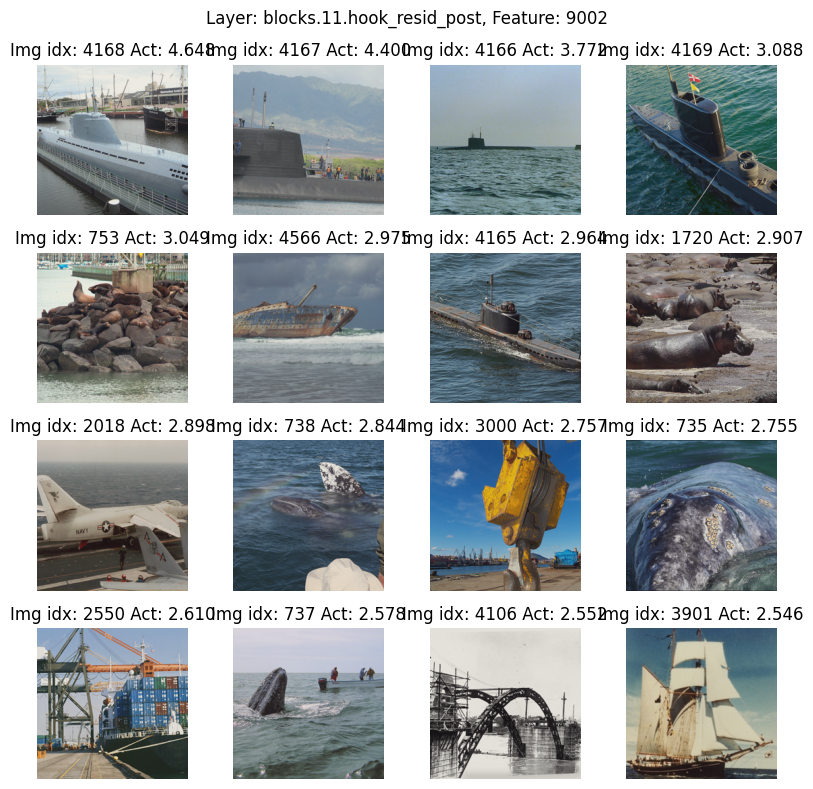

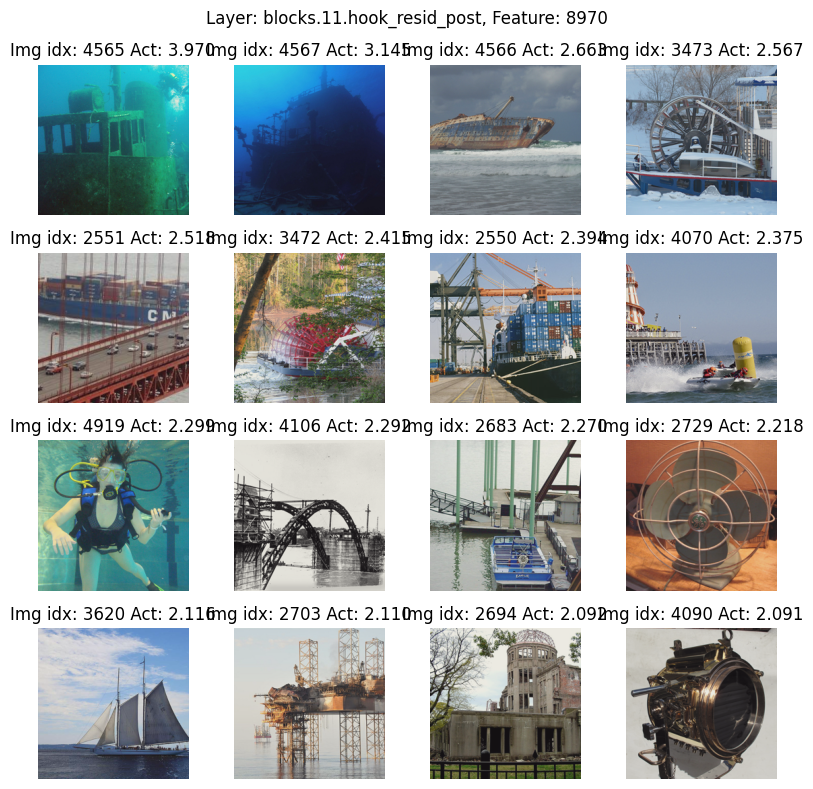

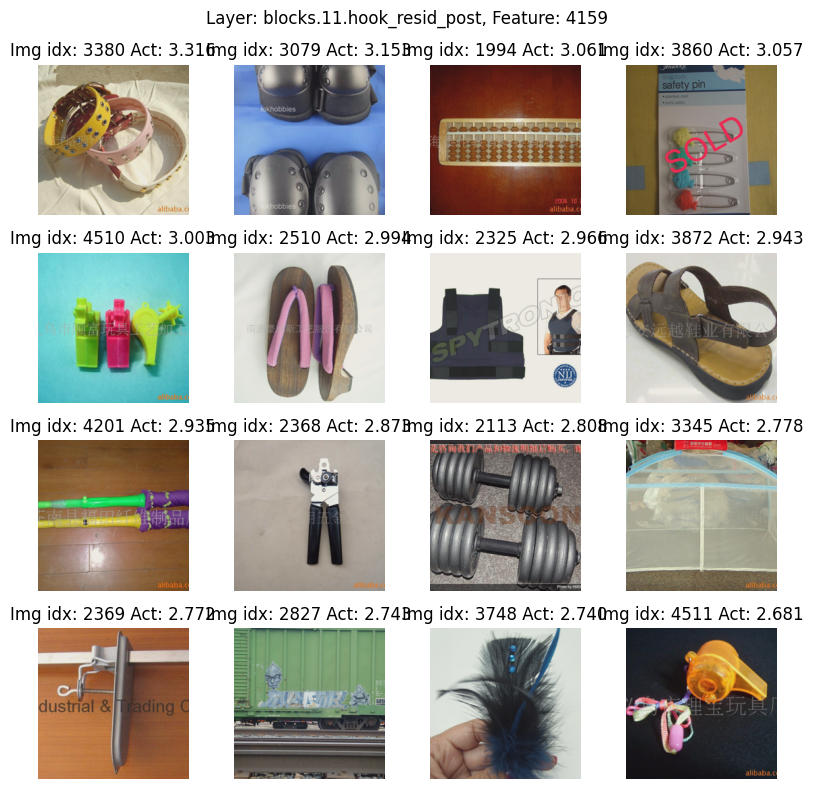

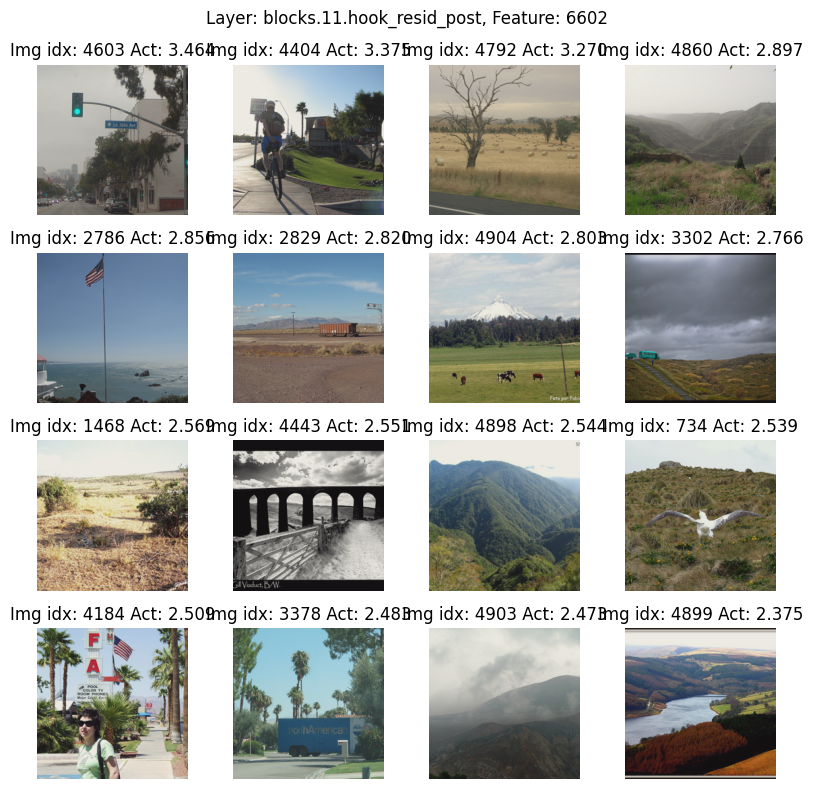

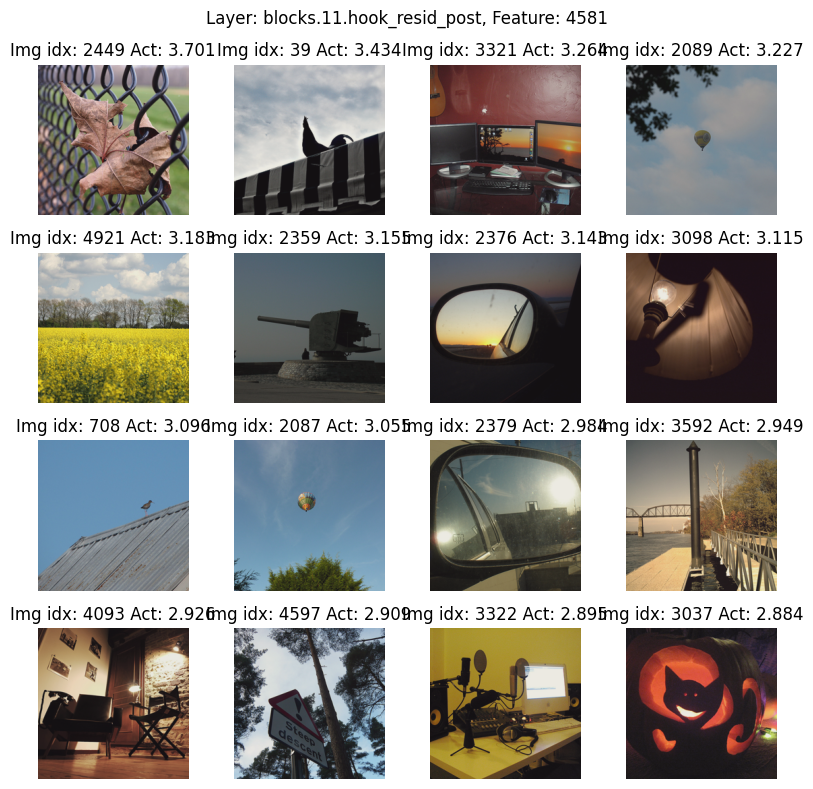

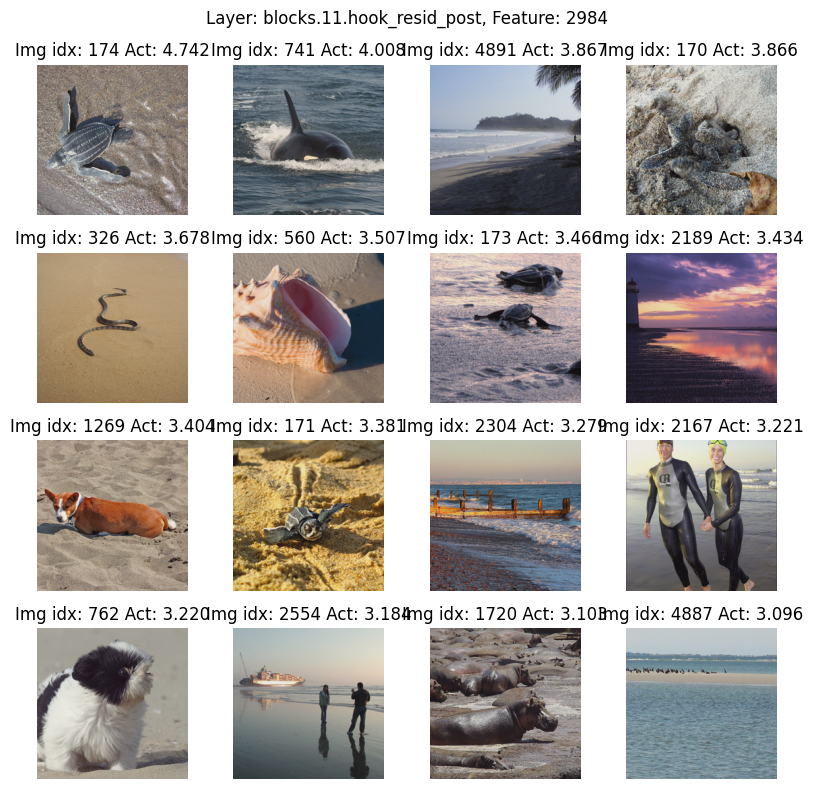

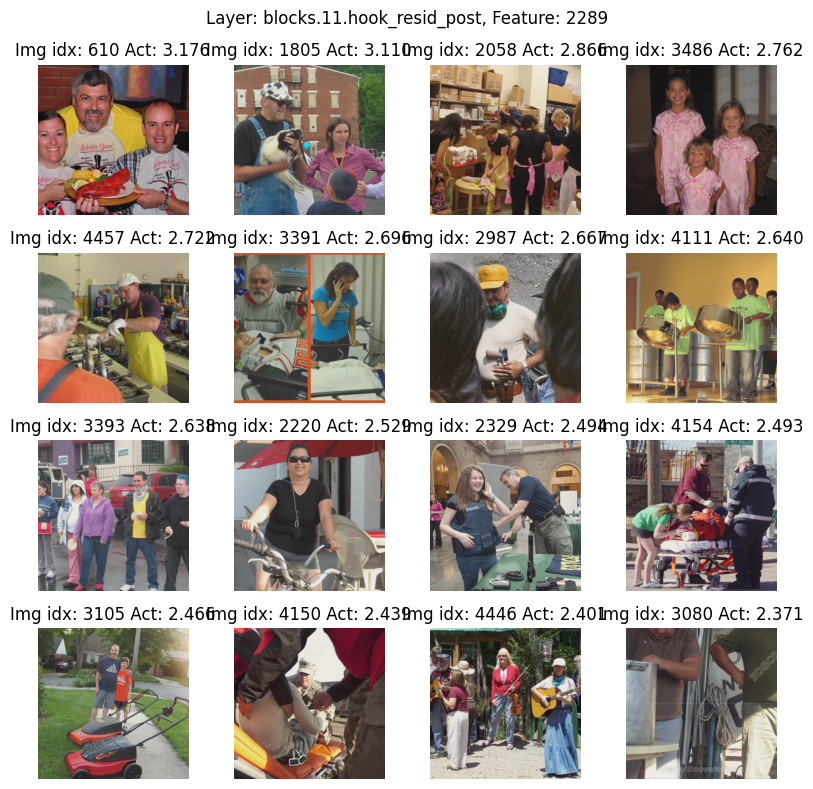

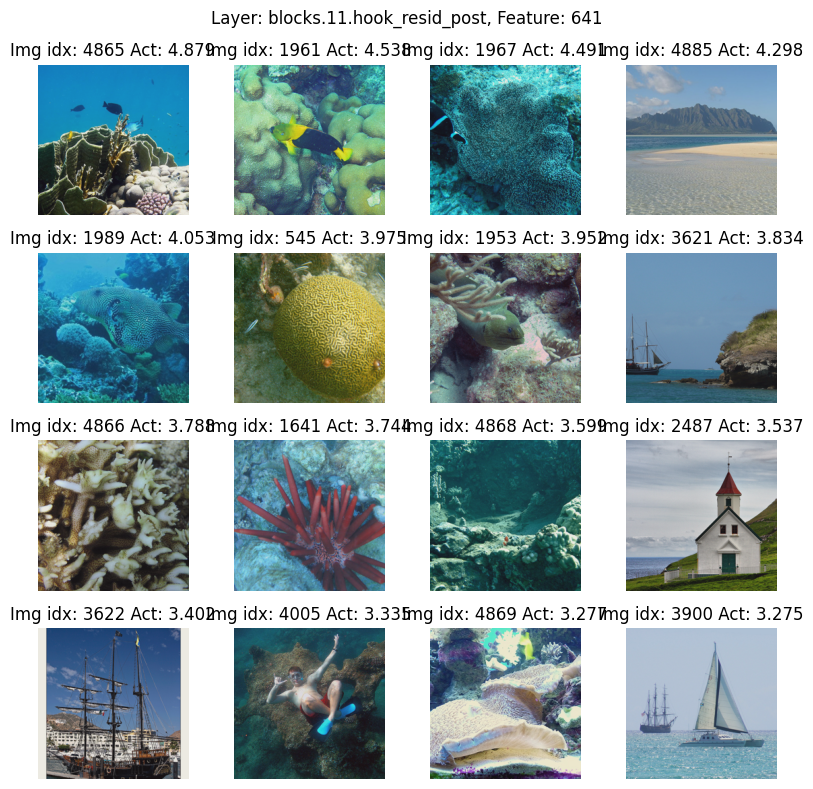

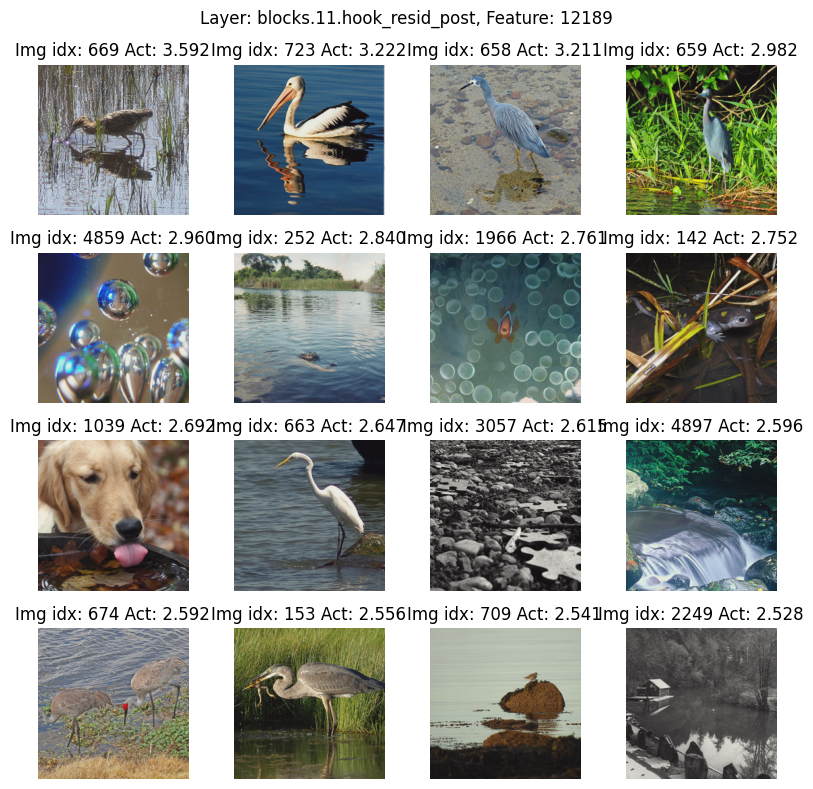

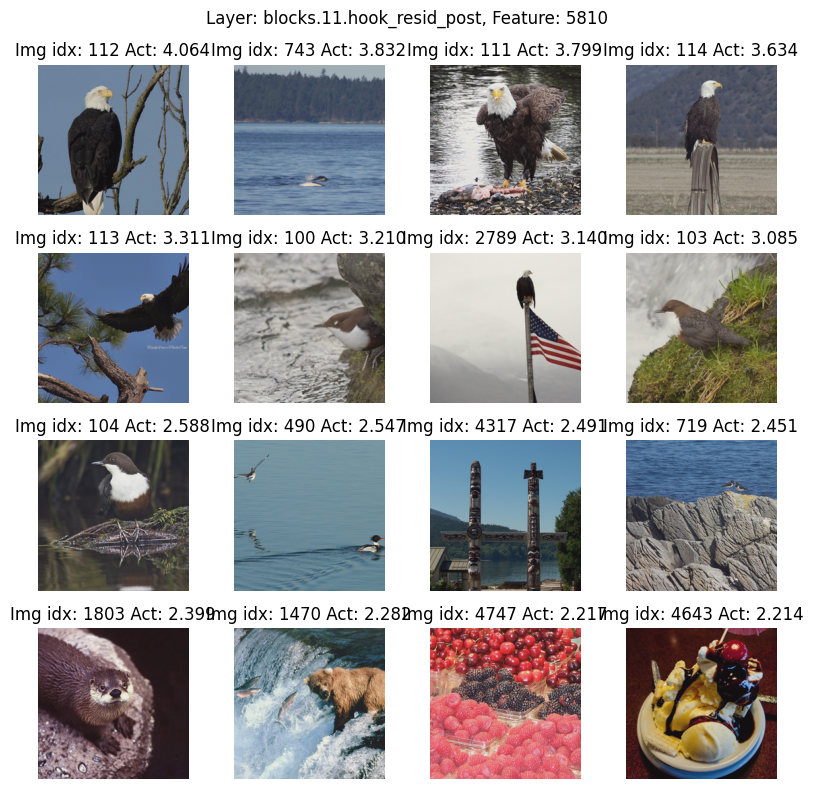

In [104]:
plot_all_features(top_activations_dictionary, subset_dataset, sae.cfg, num_features=20)

### top features for a given text

In [21]:
import os
import json
import torch
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader
from tqdm.auto import tqdm

# --- 1. CONFIGURATION ---
IMAGENET_VAL_DIR = '/home/nfm/data_prisma/imagenet_val/kaggle/input/imagenet-object-localization-challenge/ILSVRC/Data/CLS-LOC/val/'
OUTPUT_PATH = '/home/nfm/ViT-Prisma/mynotebooks/clip_topk_20.pt'
LOCAL_JSON_PATH = "/home/nfm/ViT-Prisma/demos/imagenet_class_index.json"
BATCH_SIZE = 50 # Exactly 1 class per batch
DEVICE = 'cuda'

# --- 2. LOAD CLASS NAMES ---
with open(LOCAL_JSON_PATH, 'r') as f:
    imagenet_class_index = json.load(f)

# Create a mapping from simple integer index (0-999) to clean class names
idx_to_name = {}
for str_idx, (wnid, class_name) in imagenet_class_index.items():
    safe_class_name = class_name.replace(" ", "_").replace("/", "_").replace(",", "")
    idx_to_name[int(str_idx)] = safe_class_name

mytransform = get_clip_val_transforms()
# mytransform = transforms.Compose([
#         transforms.Resize(256, interpolation=transforms.InterpolationMode.BICUBIC),
#         transforms.CenterCrop(224),
#         transforms.ToTensor(),
#         transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
#         ])

# --- 3. DATASET & DATALOADER ---
# Assuming 'transform' is defined (use the appropriate timm/CLIP transform)
dataset = ImageFolder(IMAGENET_VAL_DIR, transform=mytransform) 
dataloader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)

# --- 4. PREPARE THE SCORE MATRIX ---
# Assuming your SAE dimension is 12288 (768 * 16)
num_features = sae.cfg.d_in * sae.cfg.expansion_factor 
# num_classes = 1000
indices_dict = torch.load("/home/nfm/ViT-Prisma/demos/indices_forclip_dict.pt", weights_only=False)
txt_pth = "/home/nfm/clip_text_span/text_descriptions/image_descriptions_general.txt"
with open(txt_pth, "r") as f:
    texts = [line.strip() for line in f.readlines()]
num_classes = len(indices_dict)

# Shape: [12288 features, 1000 classes]
feature_class_scores = torch.zeros((num_features, num_classes), dtype=torch.float32, device=DEVICE)

model.eval()
sae.eval()

print(f"Extracting SAE activations for {num_classes} classes...")

batch_size = 20*20

# --- 5. MAIN EXTRACTION LOOP ---
# with torch.no_grad():
#     # for batch_imgs, batch_labels in tqdm(dataloader, total=len(dataloader)):
#     batch_indices = []
#     class_indices = []
#     for i in tqdm(range(num_classes)):
#         batch_indices = batch_indices + list(indices_dict[i][:20])
#         class_indices.append(i)
#         if len(batch_indices) == batch_size:
#             batch_imgs = torch.stack([dataset[idx][0] for idx in batch_indices]) #
#             batch_imgs = batch_imgs.to(DEVICE)
            
#             # Since batch_size=50, all labels in this batch are the same class
#             # class_idx = batch_labels[0].item()
#             # class_idx = i
#             # class_indices.append(class_idx)

#             # 1. Run forward pass through ViT to get the hook activations
#             _, cache = model.run_with_cache(batch_imgs, names_filter=sae.cfg.hook_point)
#             hook_point_activation = cache[sae.cfg.hook_point] # Shape: [50, 50, 768] (or 197 for patch16)
#             # break

#             # 2. Extract ONLY the CLS token
#             cls_activation = hook_point_activation[:, 0, :] # Shape: [50, 768]

#             # 3. Calculate SAE features for the CLS tokens
#             _, feature_acts, *_ = sae(cls_activation) # Shape: [50, 12288]

#             for class_idx in class_indices:
#                 # avg_feature_acts = feature_acts.mean(dim=0) # Shape: [12288]
#                 avg_feature_acts = feature_acts[class_idx:class_idx+20].mean(dim=0) # Shape: [12288]
#                 feature_class_scores[:, class_idx] = avg_feature_acts
#             # break
#             batch_indices = []
#             class_indices = []

with torch.no_grad():
    batch_indices = []
    class_indices = []

    def process_batch(batch_indices, class_indices):
        batch_imgs = torch.stack([dataset[idx][0] for idx in batch_indices]).to(DEVICE)
        _, cache = model.run_with_cache(batch_imgs, names_filter=sae.cfg.hook_point)
        cls_activation = cache[sae.cfg.hook_point][:, 0, :]  # [N*20, 768]
        _, feature_acts, *_ = sae(cls_activation)            # [N*20, 12288]

        for j, class_idx in enumerate(class_indices):
            # j is the position *within this batch* (0, 1, 2 ...), not the global class index
            avg = feature_acts[j*20 : (j+1)*20].mean(dim=0)
            feature_class_scores[:, class_idx] = avg

    for i in tqdm(range(num_classes)):
        batch_indices += list(indices_dict[i][:20])
        class_indices.append(i)
        if len(class_indices) == 20:   # 20 classes × 20 images = 400 images per batch
            process_batch(batch_indices, class_indices)
            batch_indices = []
            class_indices = []

    if batch_indices:   # flush the last partial batch
        process_batch(batch_indices, class_indices)


# --- 6. SAVE TO DISK ---
torch.save(feature_class_scores.cpu(), OUTPUT_PATH)
print(f"Complete! Saved [12288, {num_classes}] tensor to {OUTPUT_PATH}")

Extracting SAE activations for 3498 classes...


100%|██████████| 3498/3498 [12:07<00:00,  4.81it/s]


Complete! Saved [12288, 3498] tensor to /home/nfm/ViT-Prisma/mynotebooks/clip_topk_20.pt


In [11]:
OUTPUT_PATH = '/home/nfm/ViT-Prisma/mynotebooks/clip_topk_20.pt'
feature_class_scores = torch.load(OUTPUT_PATH)

In [24]:
# final_tensor.shape, per_head_attribution.shape, final_tensor[1, 0].shape
# feature_class_scores.shape, feature_class_scores.max(), feature_class_scores.min()
# count values above 0
num_positive = (feature_class_scores > 0.01).sum().item()
print(f"Number of positive values in feature_class_scores: {num_positive} out of {feature_class_scores.numel()} total values")

#check if there are any NaN values
# num_nan = torch.isnan(feature_class_scores).sum().item()
# print(f"Number of NaN values in feature_class_scores: {num_nan} out of {feature_class_scores.numel()} total values")

Number of positive values in feature_class_scores: 535319 out of 42983424 total values


In [27]:
# (feature_class_scores[1] > 0).sum().item()
# find non_zero indices from feature_class_scores[1], and print the corresponding class names from texts
gaga = 0
for i in range(feature_class_scores.shape[0]):
    non_zero_indices = (feature_class_scores[i] > 2).nonzero(as_tuple=True)[0]
    if len(non_zero_indices) == 0:
        # print(f"No non-zero activations for feature {i}")
        pass
    else:
        print(f"Non-zero feature activations for feature {i} found in classes: {len(non_zero_indices)}")
        counter = 0
        for idx in non_zero_indices:
            # class_name = idx_to_name.get(idx.item(), "Unknown")
            class_name = texts[idx.item()] if idx.item() < len(texts) else "Unknown"
            print(f"Class index: {idx.item()}, Class name: {class_name}, Activation value: {feature_class_scores[i, idx].item():.4f}")
            counter += 1
            if counter >= 10:  # Limit to first 5 classes for brevity
                break
        gaga += 1
        print("="*50)

    if gaga == 10:
        break

Non-zero feature activations for feature 209 found in classes: 25
Class index: 130, Class name: Aerial view of a bay, Activation value: 2.2989
Class index: 140, Class name: Aerial view of a harbor, Activation value: 2.9014
Class index: 149, Class name: Aerial view of an ocean coastline, Activation value: 2.9226
Class index: 404, Class name: an image of monaco, Activation value: 2.0495
Class index: 407, Class name: an image of portsmouth, Activation value: 2.6310
Class index: 524, Class name: A photo of Monaco, Activation value: 2.1205
Class index: 758, Class name: A tailfin, Activation value: 2.9367
Class index: 997, Class name: coastal view, Activation value: 2.1795
Class index: 1064, Class name: Crashing ocean waves, Activation value: 2.0383
Class index: 1603, Class name: Image captured in the Californian coastline, Activation value: 2.0246
Non-zero feature activations for feature 322 found in classes: 14
Class index: 61, Class name: A caterpillar, Activation value: 3.1034
Class inde

In [ ]:
def print_feature_labels(feature_id, top_k=10, isnew=True, verbose=True):
    # Get the scores for this specific feature across all 1000 classes
    scores = feature_class_scores[feature_id] if isnew else feature_class_scores2[feature_id]
    
    # Get the top K class indices and their scores
    top_scores, top_indices = torch.topk(scores, k=top_k)
    
    if verbose:
        print(f"\n--- Top {top_k} Classes for Feature {feature_id} ---")
        for rank, (score, cls_idx) in enumerate(zip(top_scores, top_indices)):
            if not isnew:
                class_name = idx_to_name[cls_idx.item()]
            else:
                class_name = texts[cls_idx.item()] if cls_idx.item() < len(texts) else f"Class_{cls_idx.item()}"
            
            # Only print if the feature actually fired (score > 0)
            if score.item() > 0:
                print(f"{rank+1}. {class_name} (Score: {score.item():.3f})")
            else:
                print(f"{rank+1}. [No more positive activations]")
                break
    return top_indices, top_scores

# Test it on a random feature!
# print_feature_labels(feature_id=42)
# print_feature_labels(feature_id=9429)
xx = 0
for feature_id in range(0, feature_class_scores.shape[0]):
    if torch.count_nonzero(feature_class_scores[feature_id] > 2):
        print_feature_labels(feature_id=feature_id, top_k=5)
        # print_feature_labels(feature_id=feature_id, top_k=5, isnew=False)
        xx += 1
    if xx > 10:
        break


--- Top 5 Classes for Feature 209 ---
1. thrilling water sports moment (Score: 3.505)
2. Intense water sports moment (Score: 3.095)
3. A tailfin (Score: 2.937)
4. Aerial view of an ocean coastline (Score: 2.923)
5. Aerial view of a harbor (Score: 2.901)

--- Top 5 Classes for Feature 322 ---
1. A snake (Score: 4.197)
2. A caterpillar (Score: 3.103)
3. Image with a caterpillar (Score: 2.975)
4. A snail (Score: 2.551)
5. A rope (Score: 2.551)

--- Top 5 Classes for Feature 349 ---
1. Picture taken in India (Score: 6.524)
2. Picture taken in a rural village (Score: 5.110)
3. Picture taken in Morocco (Score: 4.975)
4. Photo taken in Nepal (Score: 4.681)
5. Image taken in Morocco (Score: 4.531)

--- Top 5 Classes for Feature 404 ---
1. Image with an owl (Score: 3.710)
2. Picture of a feline (Score: 0.300)
3. Eyes (Score: 0.156)
4. Caricature of a king (Score: 0.151)
5. An image of a king (Score: 0.151)

--- Top 5 Classes for Feature 432 ---
1. detailed arachnid close-up (Score: 3.959)
2. d

In [33]:
counter = 0
for feature_id in range(feature_class_scores.shape[0]):
    scores = feature_class_scores[feature_id]
    top_scores, top_indices = torch.topk(scores, k=5)

    names = []

    for rank, (score, cls_idx) in enumerate(zip(top_scores, top_indices)):
        class_name = texts[cls_idx.item()] if cls_idx.item() < len(texts) else f"Class_{cls_idx.item()}"
        names.append(class_name)
        # print(f"Feature {feature_id} - Rank {rank+1}: Class '{class_name}' with score {score.item():.4f}")
    # chack if any of the top 5 names starts with "A photo with the letter"
    string_to_check = "A photo with the letter"
    # string_to_check = "An irregular"
    if any(name.startswith(string_to_check) for name in names):
        # print(f"Feature {feature_id} - Top 5 classes: {names} with scores {top_scores.tolist()}")
        print_feature_labels(feature_id, top_k=10, isnew=True, verbose=True)
        counter += 1
    if counter > 5: # Just print the top 10 features for brevity    
        break